In [12]:
from matplotlib.pyplot import imshow
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
import cv2 as cv
import math

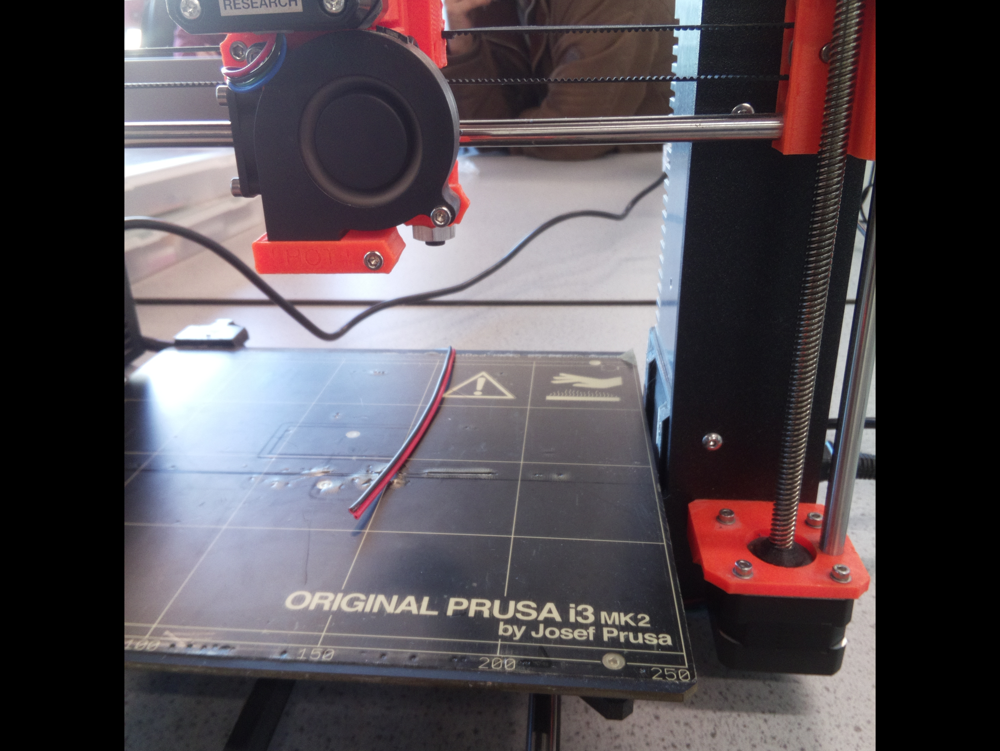

In [13]:
im = Image.open('../data/2023_11_17_12_30/fourth.jpg', 'r')
# im = im.resize((im.width // 8, im.height // 8))
im = im.rotate(90)
display(im)

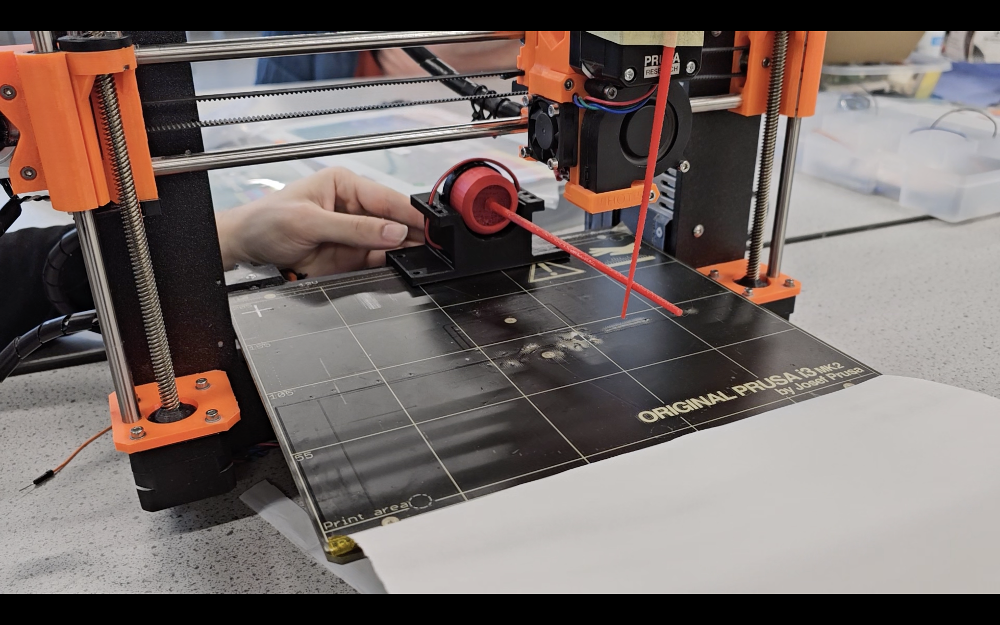

In [14]:
im = Image.open('../data/2023_11_27_11_55/Screenshot 2023-11-28 at 11.35.13.png', 'r')
# im = im.resize((im.width // 8, im.height // 8))
# im = im.rotate(90)
display(im)

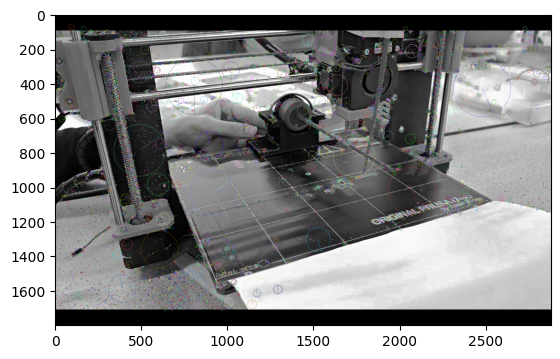

In [15]:
sift = cv.SIFT_create()
im_array = np.array(im)

gray= cv.cvtColor(im_array,cv.COLOR_BGR2GRAY)

gray = cv.equalizeHist(gray)
kp1, des1 = sift.detectAndCompute(gray,None)

output_image = cv.drawKeypoints(gray, kp1, im_array, 
                                 flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) 
plt.imshow(output_image) 
plt.show()

In [16]:
# corners = np.int0(corners)
# for i in corners:
#     x,y = i.ravel()
#     cv.circle(gray,(x,y),3,255,-1)
# plt.imshow(gray)
# plt.show()

1800
215


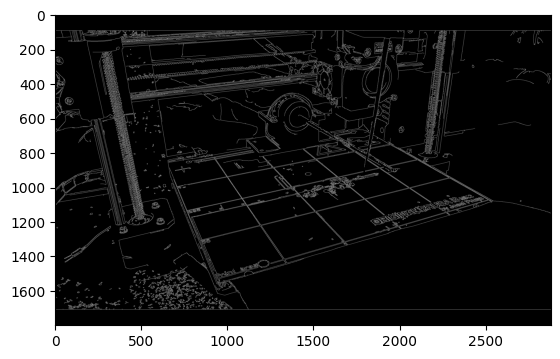

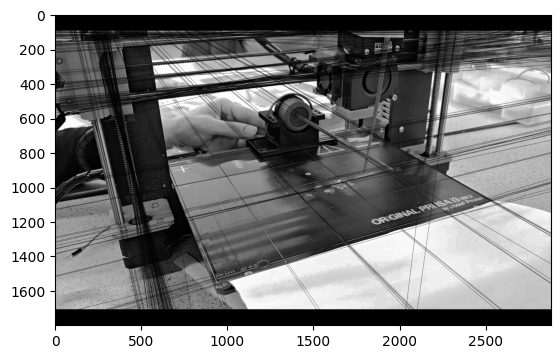

In [17]:
im_array = np.array(im)
gray= cv.cvtColor(im_array,cv.COLOR_BGR2GRAY)
gray = cv.equalizeHist(gray)

edges = cv.Canny(gray, 50, 200, None, 3)
print(len(edges))
plt.imshow(edges,cmap = 'gray')

#  Standard Hough Line Transform
lines = cv.HoughLines(edges, 
rho=1, 
theta=np.pi / 180, 
threshold=300)
print(len(lines))

def draw_lines(gray, lines, line_width = 1):
    # Draw the lines
    if lines is not None:
        for i in range(0, len(lines)):
            rho = lines[i][0][0]
            theta = lines[i][0][1]
            a = math.cos(theta)
            b = math.sin(theta)
            x0 = a * rho
            y0 = b * rho
            pt1 = (int(x0 + 4000*(-b)), int(y0 + 4000*(a)))
            pt2 = (int(x0 - 4000*(-b)), int(y0 - 4000*(a)))
            cv.line(gray, pt1, pt2, (0,0,0), line_width, cv.LINE_AA)

    plt.figure()
    plt.imshow(gray,cmap = 'gray')

draw_lines(gray, lines)
        


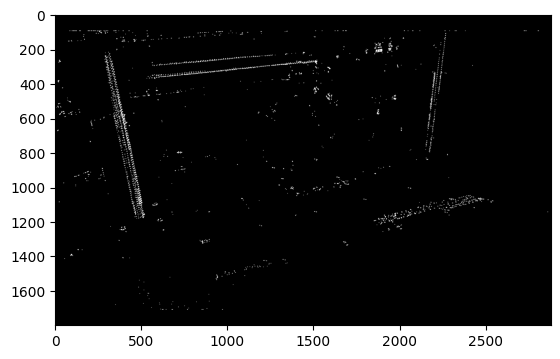

In [18]:
im_array = np.array(im)
gray= cv.cvtColor(im_array,cv.COLOR_BGR2GRAY)
eq_gray = cv.equalizeHist(gray)

gray = np.float32(eq_gray)
dst = cv.cornerHarris(gray,2,3,0.04)
dst = cv.dilate(dst,None)
ret, dst = cv.threshold(dst,0.005*dst.max(),255,0)
dst = np.uint8(dst)

plt.imshow(dst, cmap = 'gray')

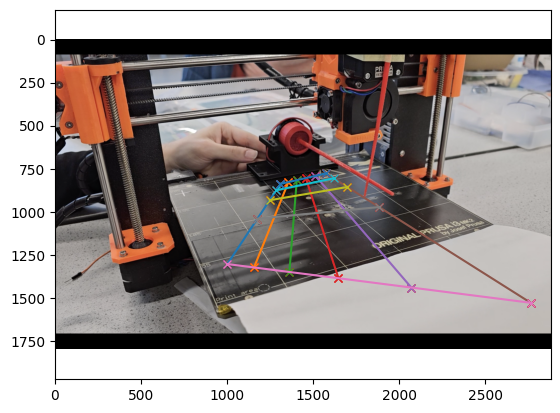

(-145.0593316204833,
 145.0593316204833,
 -145.0593316204833,
 145.0593316204833,
 -28.79449871536248,
 188.79449871536247)

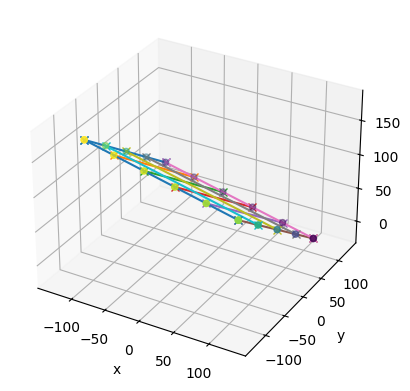

In [19]:
# intialise lines of the grid
im_array = np.array(im)
gray = cv.cvtColor(im_array, cv.COLOR_BGR2GRAY)
eq_gray = cv.equalizeHist(gray)

focal_length = 20
block_width = 50
grid_height = 4 * 50
grid_width = 5 * 50
z_start =  - grid_height / 2
z_end =  + grid_height / 2
x_start = -grid_width / 2
x_end = grid_width / 2
vertical_lines = [
    [(x, 0, z_start), (x, 0, z_end)]
    for x in np.arange(x_start, x_end+1, block_width)
]
horizontal_lines = [
    [(x_start, 0, z), (x_end, 0, z)]
    for z in np.arange(z_start, z_end+1, block_width)
]

grid_lines = vertical_lines + horizontal_lines

f_x = f_y = im_array.shape[1] / focal_length

# print(im_array.shape[1], grid_width)
c_x = im_array.shape[1]/2
c_y = im_array.shape[0]/2

# rotation = np.random.rand(3) * np.pi/2
# translation = np.random.rand(3) * focal_length
rotation = np.zeros([3]) * np.pi/2
translation = (np.zeros([3])).reshape(3,1)
cam_mat = np.array([[f_x, 0, c_x], [0, f_y, c_y], [0, 0, 1]])

translation[2] = 4 * focal_length
rotation[0] = 1 # x 
rotation[1] = 0 # y
rotation[2] = -0.2 # z

from scipy.spatial.transform import Rotation as R
rot = R.from_rotvec(rotation)
rot_mat = rot.as_matrix()
projected_points  = []
points = []
for line in grid_lines:
    for point in line:
        point = np.array(point).reshape(3,1)
        projected_point = np.matmul(cam_mat, (np.matmul(rot_mat, point) + translation))
        projected_points.append(projected_point)
        points.append(np.matmul(rot_mat, point)+ translation)

projected_points = [(pt[0]/pt[2], pt[1]/pt[2]) for pt in projected_points]
plt.plot([pt[0] for pt in projected_points], [pt[1] for pt in projected_points], "xr")
for i in range(len(projected_points)):
    if i%2: continue
    line = [projected_points[i], projected_points[i+1]]
    plt.plot(
        [pt[0] for pt in line],
        [pt[1] for pt in line],
        "-x"
    )
plt.axis("equal")
plt.imshow(im_array, cmap = 'gray')
plt.show()

ax = plt.figure().add_subplot(projection='3d')
ax.scatter([pt[0] for pt in points], [pt[1] for pt in points], [pt[2] for pt in points], c = [pt[2] for pt in points])

for i in range(len(points)):
    if i%2: continue
    line = [points[i], points[i+1]]
    ax.plot(
        [pt[0] for pt in line],
        [pt[1] for pt in line],
        [pt[2] for pt in line],
        "-x"
    )
    
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
plt.axis("equal")



[(array([3645.69049743]), array([-0.58507031])), (array([1765.71761481]), array([-0.38253841])), (array([939.36099121]), array([-0.08090641])), (array([387.73420086]), array([0.31501477])), (array([-2531.53610602]), array([0.70913751])), (array([2128.74226027]), array([1.00758708])), (array([-2630.95427311]), array([4.58543009])), (array([-2002.68220303]), array([-1.47534588])), (array([-1925.8136278]), array([-1.40220088])), (array([-1904.9745304]), array([-1.36625])), (array([-1897.74199234]), array([-1.34492755]))]


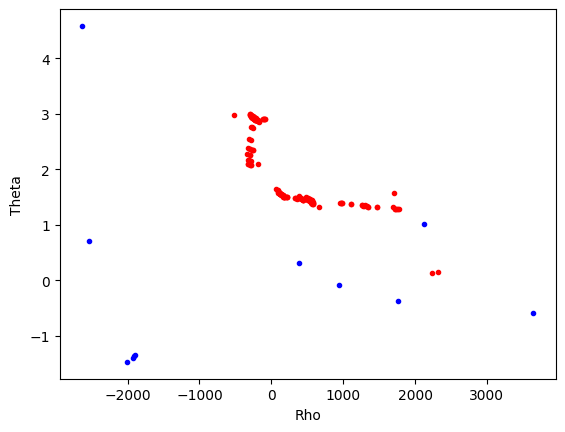

In [20]:
# convert all lines to hough space

points_in_hough_space = []
for i in np.arange(0, len(projected_points), 2):
    a = projected_points[i]
    b = projected_points[i+1]

    gradient =  (a[1] - b[1])/ (a[0] - b[0])

    theta = np.pi/2 - np.arctan2(a[1] - b[1], a[0] - b[0])

    rho = (b[0] - gradient * b[1]) / (np.sin(theta) - gradient * np.cos(theta))

    points_in_hough_space.append((rho, theta))


print(points_in_hough_space)
plt.plot([pt[0] for pt in points_in_hough_space], [pt[1] for pt in points_in_hough_space], "b.")
plt.plot([pt[0][0] for pt in lines], [pt[0][1] for pt in lines], "r.")


plt.ylabel("Theta")
plt.xlabel("Rho")
plt.show()


In [21]:
def project_points(points, rotation_vec, translation_vec, camera_matrix):
    rot = R.from_rotvec(rotation_vec)
    rot_mat = rot.as_matrix()
    translation_vec = np.array(translation_vec).reshape(3, 1)

    projected_points = []
    for point in points:
        point = np.array(point).reshape(3, 1)
        projected_point = np.matmul(
            camera_matrix, (np.matmul(rot_mat, point) + translation_vec)
        )
        projected_points.append(
            (
                projected_point[0] / projected_point[2],
                projected_point[1] / projected_point[2],
            )
        )

    return projected_points


def plot_points(projected_points):
    plt.plot(
        [pt[0] for pt in projected_points], [pt[1] for pt in projected_points], "xr"
    )
    for i in range(len(projected_points)):
        if i % 2:
            continue
        line = [projected_points[i], projected_points[i + 1]]
        plt.plot([pt[0] for pt in line], [pt[1] for pt in line], "-x")
    plt.axis("equal")


def hough_transform(a, b):
    gradient = (a[1] - b[1]) / (a[0] - b[0])
    theta = np.pi / 2 - np.arctan2(a[1] - b[1], a[0] - b[0])
    rho = (b[0] - gradient * b[1]) / (np.sin(theta) - gradient * np.cos(theta))

    return rho, theta


def plot_hough(projected_points, color='b'):
    points_in_hough_space = [
        hough_transform(projected_points[i], projected_points[i + 1])
        for i in np.arange(0, len(projected_points), 2)
    ]

    plt.plot(
        [pt[0] for pt in points_in_hough_space],
        [pt[1] for pt in points_in_hough_space],
        color + ".",
    )

<Figure size 640x480 with 0 Axes>

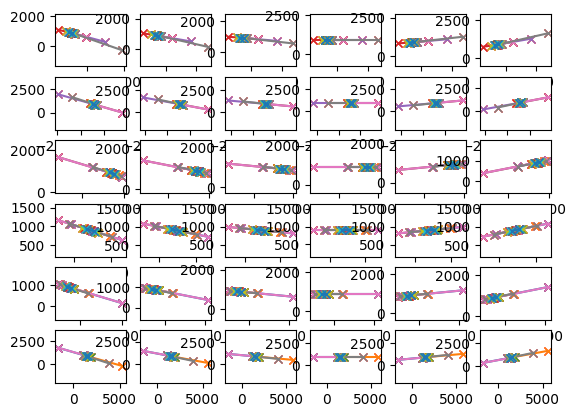

<Figure size 640x480 with 0 Axes>

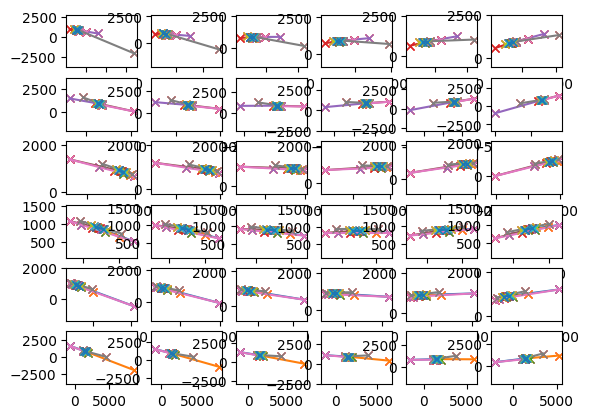

<Figure size 640x480 with 0 Axes>

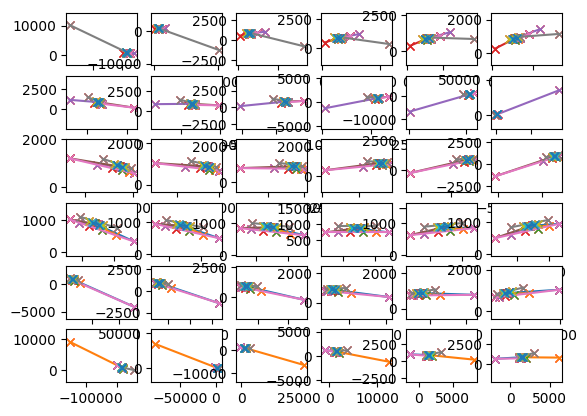

<Figure size 640x480 with 0 Axes>

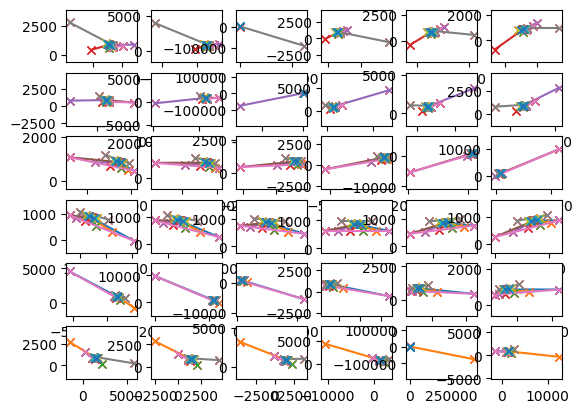

<Figure size 640x480 with 0 Axes>

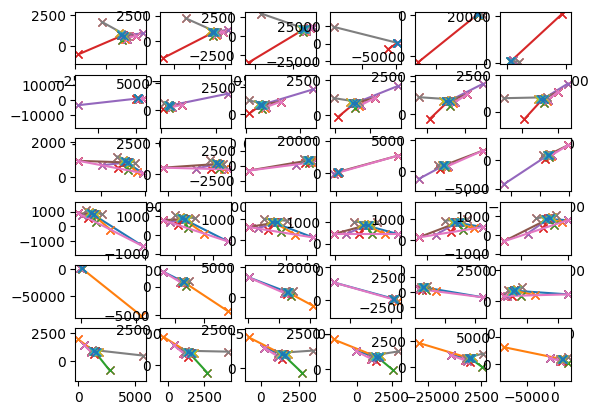

In [23]:
f_x = f_y = im_array.shape[1] / focal_length

# print(im_array.shape[1], grid_width)
c_x = im_array.shape[1]/2
c_y = im_array.shape[0]/2

# rotation = np.random.rand(3) * np.pi/2
# translation = np.random.rand(3) * focal_length
rotation = np.zeros([3]) * np.pi/2
translation = (np.zeros([3])).reshape(3,1)
cam_mat = np.array([[f_x, 0, c_x], [0, f_y, c_y], [0, 0, 1]])

translation[2] = 4 * focal_length
rotation[0] = 1 # x 
rotation[1] = 0 # y
rotation[2] = -0.2 # z

# using the variable axs for multiple Axes

for x_rot in np.arange(0, 0.5, 0.1):
    plt.figure()
    fig, axs = plt.subplots(6, 6)
    for i, y_rot in enumerate(np.arange(-.3, 0.3, 0.1)):
        for j, z_rot in enumerate(np.arange(-.3, 0.3, 0.1)):
            points = []
            for line in grid_lines:
                for point in line:
                    points.append(point)

            
            projected_points = project_points(points, [x_rot, y_rot, z_rot], translation, cam_mat)
            plt.sca(axs[i, j])
            plot_points(projected_points)